In [ ]:
!python --version

Python 3.10.12


In [ ]:
# Conexión con el almacenamiento de Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# GPUs utilizada para el entrenamiento e inferencia

In [ ]:
!nvidia-smi #Tesla v100 para entrenamiento v9

Tue Jan 30 18:44:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!nvidia-smi #Tesla T4 para entrenamiento v7 y para inferencia

Wed Jan 31 04:02:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8              13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Preparación de los requisitos de YOLOv5

In [ ]:
#Clonación del repositorio
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 3 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.95 MiB | 24.29 MiB/s, done.
Resolving deltas: 100% (11260/11260), done.


In [ ]:
#----> Directorio de trabajo movido hacia la carpeta base de yolo
%cd yolov5
!pip install -r requirements.txt

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 710.2/710.2 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.8 MB/s eta 0:00:00


# Entrenamiento

Experimentos

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 20 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5m.pt
# V1
# Se utiliza el conjunto de datos inicial más 100 imágenes de fondo,
# se cambia el tamaño nativo de las imgs a 1280, más épocas y bz=auto

2023-12-25 03:42:59.327434: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-25 03:42:59.327494: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-25 03:42:59.328886: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, o

Resultados experimentales en el conjunto de prueba no validan las métricas alcanzadas en esta versión. Se descarta el uso del modelo yolov5m.pt

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 31 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt
# v3
# Modelo large yolov5l.pt
# Número de epocas +10

2023-12-26 23:48:52.962153: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-26 23:48:52.962213: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-26 23:48:52.963619: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=31, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, o

Resultados experimentales sobre el conjunto de prueba no confirman un buen desempeño del entrenamiento. En escenas originales no se detectan o con una confianza muy baja las instancias presentes.

In [ ]:
!python train.py --img 640 --batch-size -1 --epochs 31 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt
# v4
# Modelo large
# Mismo número de epocas 30
# se reduce img_s 640

2024-01-01 23:35:10.682554: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-01 23:35:10.682624: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-01 23:35:10.683946: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=31, batch_size=-1, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, op

Los resultados son peores a los obtenidos en comparación con las métricas y validaciones correspondientes a un tamaño de imagen de 1280 px

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 41 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt --cache ram
# v5
# Modelo large
# Número de epocas 40
# img_s 1280
# Carga de imagenes en ram

2024-01-02 16:22:18.297669: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-02 16:22:18.297710: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-02 16:22:18.299221: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=41, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, op

EL modelo presenta un buen rendimiento pero, en comparación con modelos anteriores y en la inferencia en video, demuestra aún un pobre rendimiento.

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 80 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt --cache ram
# v6
# Modelo large,
# Número de epocas 80,
# img_s 1280

2024-01-02 20:53:05.993834: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-02 20:53:05.993890: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-02 20:53:05.995882: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=80, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, op

Existe una evidente mejoría del modelo en cuanto a inferencia en video, sin embargo las métricas de entrenamiento del error box_loss y obj_loss indican que aún no se ha llegado a un punto de estabilidad. Existe underfitting.

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 101 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt --cache ram
# v7,
# Modelo large
# Número de epocas 100, img_s 1280
# Carga de imágenes en caché
# Batch_size en automático

2024-01-03 21:45:09.940055: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-03 21:45:09.940119: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-03 21:45:09.941502: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=101, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False

El segundo mejor modelo. Alcanza la estabilidad en las 100 épocas y tiene las mejores métricas de entrenamiento, prueba y validación hasta el momento. Sigue padeciendo en las pruebas realizadas sobre video en las 3 variedades.

In [ ]:
!python train.py --img 1280 --batch-size -1 --epochs 121 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt --cache ram --hyp /content/yolov5/data/hyps/hyp.scratch-med.yaml
# v8
# Modelo large,
# Número de epocas 120,
# img_s 1280
# técnicas de aumento de datos más agresivas y apliación de MixUp --med-dataaugment

2024-01-30 03:18:22.784736: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 03:18:22.784812: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 03:18:22.786237: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=/content/yolov5/data/hyps/hyp.scratch-med.yaml, epochs=121, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, ima

Modelo con resultados de inferencia en video mejores que los de la v7, pero con presencia de underfitting en las curvas del pérdida box_loss y obj_loss.

In [ ]:
!python train.py --img 1280 --batch-size 8 --epochs 201 --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --weights yolov5l.pt --cache ram --hyp /content/yolov5/data/hyps/hyp.scratch-med.yaml
# v9
# Modelo large yolov5l.pt
# Número de epocas 200
# img_s 1280
# mismo aumento de datos que v8 --med-dataaugment
# batch_size = 8

2024-01-30 18:45:22.316997: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 18:45:22.317058: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 18:45:22.318531: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, hyp=/content/yolov5/data/hyps/hyp.scratch-med.yaml, epochs=201, batch_size=8, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, imag

El mejor modelo obtenido, las gráficas de pérdida convergen al final de las épocas y se obtienen excelentes resultados en las métricas de entrenamiento, prueba y validación. Los resultados son mejores en escenas con varias instancias y en inferencia en video.

# Evaluacion de las diferentes versiones

In [ ]:
#V7 Métricas sobre el conjunto de prueba
!python val.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v7-weights/weights/best.pt --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --task test

val: data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, weights=['/content/gdrive/MyDrive/yolo/v7-weights/weights/best.pt'], batch_size=32, imgsz=1280, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-271-g9abbef5 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning /content/gdrive/MyDrive/yolo/roses-dataset/test/labels.cache... 135 images, 15 backgrounds, 0 corrupt: 100% 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:33<00:00,  6.65s/it]
                   all        150        146      0.959      0.979      0.989      0.895
Speed: 15.6ms pre-process, 98.

In [ ]:
#V8 Métricas sobre el conjunto de prueba
!python val.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v8-weights/weights/best.pt --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --task test

val: data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, weights=['/content/gdrive/MyDrive/yolo/v8-weights/weights/best.pt'], batch_size=32, imgsz=1280, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning /content/gdrive/MyDrive/yolo/roses-dataset/test/labels.cache... 135 images, 15 backgrounds, 0 corrupt: 100% 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:26<00:00,  5.23s/it]
                   all        150        146      0.953      0.993      0.987      0.898
Speed: 19.3ms pr

In [ ]:
#V9 Métricas sobre el conjunto de prueba
!python val.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --task test

val: data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, weights=['/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt'], batch_size=32, imgsz=1280, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-283-g875d9278 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
100% 755k/755k [00:00<00:00, 148MB/s]
test: Scanning /content/gdrive/MyDrive/yolo/roses-dataset/test/labels.cache... 135 images, 15 backgrounds, 0 corrupt: 100% 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:41<00:00,  8.24s/it]
                   all        150        146      0.947      0.993      0.988  

# Evaluaciones varias sobre el mejor modelo

In [ ]:
!python detect.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt --source /content/test-imgs #v9 test

detect: weights=['/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt'], source=/content/test-imgs, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/8 /content/test-imgs/ex1.jpg: 960x1280 1 rose, 75.2ms
image 2/8 /content/test-imgs/ex2.jpg: 736x1280 4 roses, 59.4ms
image 3/8 /content/test-imgs/ex3.jpg: 736x1280 3 roses, 56.5ms
image 4/8 /content/test-imgs/k1.jpg: 736x1280 5 roses, 72.6ms
image 5/8

In [ ]:
# Comparativa de modelos v7 y v9

In [ ]:
!python detect.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v7-weights/weights/best.pt --source /content/gdrive/MyDrive/yolo/1691102725147.jpg #v7

detect: weights=['/content/gdrive/MyDrive/yolo/v7-weights/weights/best.pt'], source=/content/gdrive/MyDrive/yolo/1691102725147.jpg, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/gdrive/MyDrive/yolo/1691102725147.jpg: 736x1280 2 roses, 97.1ms
Speed: 1.1ms pre-process, 97.1ms inference, 592.9ms NMS per image at shape (1, 3, 1280, 1280)
Results saved to runs/detect/exp3


In [ ]:
!python detect.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt --source /content/gdrive/MyDrive/yolo/1691102725147.jpg #v9

detect: weights=['/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt'], source=/content/gdrive/MyDrive/yolo/1691102725147.jpg, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /content/gdrive/MyDrive/yolo/1691102725147.jpg: 736x1280 3 roses, 79.9ms
Speed: 1.0ms pre-process, 79.9ms inference, 482.5ms NMS per image at shape (1, 3, 1280, 1280)
Results saved to runs/detect/exp4


# Otras evaluaciones de versiones

In [ ]:
# Evalución dev4
!python val.py --weights /content/gdrive/MyDrive/yolo/v4-weights/weights/best.pt --data /content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml --img 640

val: data=/content/gdrive/MyDrive/yolo/roses-dataset/dataset-yolo5.yaml, weights=['/content/gdrive/MyDrive/yolo/v4-weights/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-256-g43c43d8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
100% 755k/755k [00:00<00:00, 45.3MB/s]
val: Scanning /content/gdrive/MyDrive/yolo/roses-dataset/valid/labels.cache... 133 images, 15 backgrounds, 0 corrupt: 100% 148/148 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:19<00:00,  3.84s/it]
                   all        148        141          1          1      0.995    

In [ ]:
!python detect.py --img 1280 --weights /content/gdrive/MyDrive/yolo/v7-weights/weights/best.pt --source /content/gdrive/MyDrive/yolo/Test0-4.mp4 #v7

Se truncaron las últimas líneas 5000 del resultado de transmisión.
video 1/1 (1056/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 59.7ms
video 1/1 (1057/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 58.0ms
video 1/1 (1058/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 56.4ms
video 1/1 (1059/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 54.2ms
video 1/1 (1060/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 54.0ms
video 1/1 (1061/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 57.2ms
video 1/1 (1062/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 53.2ms
video 1/1 (1063/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 59.5ms
video 1/1 (1064/6053) /content/gdrive/MyDrive/yolo/Test0-4.mp4: 736x1280 (no detections), 57.3ms
video 1/1 (1065/6053) /content/gdrive/MyDrive/yolo/Test0-4.m

In [ ]:
!python detect.py --img 1280 --weights  /content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt --source /content/gdrive/MyDrive/yolo/cama3.mp4 #v9

detect: weights=['/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt'], source=/content/gdrive/MyDrive/yolo/cama3.mp4, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/2606) /content/gdrive/MyDrive/yolo/cama3.mp4: 736x1280 1 rose, 202.1ms
video 1/1 (2/2606) /content/gdrive/MyDrive/yolo/cama3.mp4: 736x1280 1 rose, 21.5ms
video 1/1 (3/2606) /content/gdrive/MyDrive/yolo/cama3.mp4: 7

# Copia de directorio del modelo entrenado a carpeta de Drive

In [ ]:
!cp -r /content/yolov5/runs/train/exp "/content/gdrive/MyDrive/yolo/v9-weights" #-r para directorios

In [ ]:
!cp -r /content/yolov5/runs/val/exp "/content/gdrive/MyDrive/yolo/v9-weights/val" #-r para directorios

In [ ]:
!cp -r /content/yolov5/runs/detect/exp2 "/content/gdrive/MyDrive/yolo/v9-weights/test-complete-imgs" #-r para directorios

In [ ]:
!cp /content/yolov5/runs/detect/exp/EC2.mp4 "/content/gdrive/MyDrive/yolo/yolov5-res/video_inf/Inferencev9-ex.mp4" #-r para directorios

In [ ]:
!cp /content/yolov5/runs/detect/exp2/PC2D.mp4 "/content/gdrive/MyDrive/yolo/yolov5-res/video_inf/Inferencev9-pi.mp4" #-r para directorios

In [ ]:
!cp /content/yolov5/runs/detect/exp3/cama3.mp4 "/content/gdrive/MyDrive/yolo/yolov5-res/video_inf/Inferencev9-km.mp4" #-r para directorios

# Inferencia de imagen - Funciones para microservicio

## Detección y predicción del diámetro en una sola imagen

In [ ]:
import cv2
import torch

In [ ]:
def load_model(weights_path):
    model = torch.hub.load('.', 'custom', path=weights_path, source='local', _verbose=False)
    return model

In [ ]:
model = load_model('/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt')

img2 = cv2.imread('/content/ex3.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
results = model(img2, size=1280)

WARNING ⚠️ NMS time limit 0.550s exceeded


In [ ]:
df=results.pandas()
object_count = len(df.xyxy[0])

In [ ]:
df = df.xyxy[0][["xmin","ymin","xmax","ymax"]].values.astype(int)

In [ ]:
df

array([[1741, 1059, 2058, 1389],
       [1032,  490, 1233,  710],
       [2313,  226, 2584,  492],
       [1729, 1030, 1918, 1074]])

In [ ]:
df[0]

array([1741, 1059, 2058, 1389])

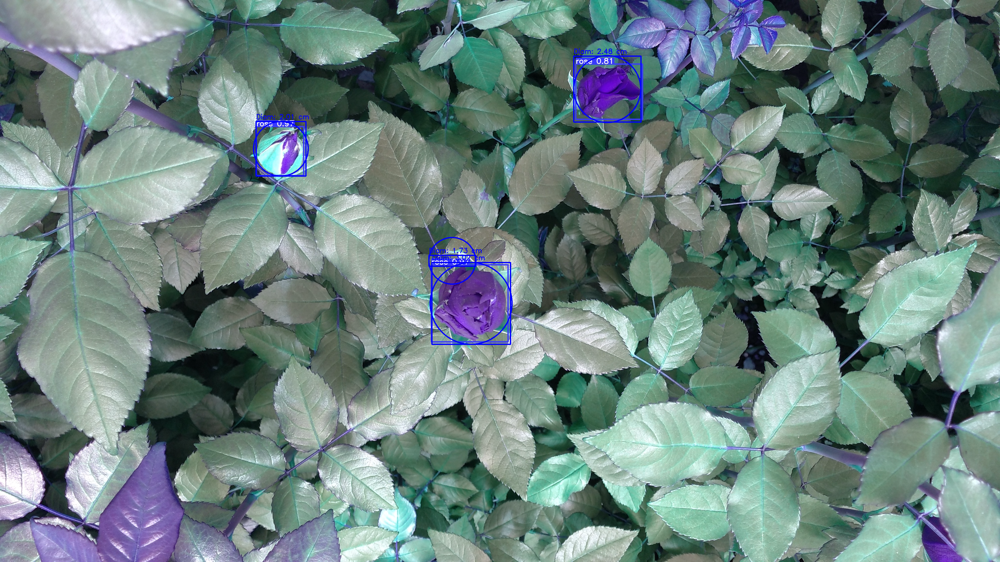

In [ ]:
for i in range(object_count):
  x1, y1, x2, y2 = df[i][0], df[i][1], df[i][2], df[i][3]
  cv2.rectangle(img2, (x1, y1), (x2, y2), (255, 0, 0), 3)

  #Width
  width = x2 - x1
  #Height
  height = y2 - y1

  #Define center of inscribed circle
  center_x = int(x1 + (width/2))
  center_y = int(y1 + (height/2))

  radius = max(width, height)/2

  cv2.circle(img2,(center_x,center_y),int(radius),(255, 0, 0), 3)

  ratio_px_cm = 235/1
  diam15 = 2*(radius / ratio_px_cm)
  cv2.putText(img2, "Diam: {} cm".format(round(diam15,2)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,0,0), 2)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

from google.colab.patches import cv2_imshow
cv2_imshow(img)

## Inferencia del diámetro en video

In [ ]:
import cv2
import torch
from google.colab.patches import cv2_imshow

In [ ]:
def load_model(weights_path):
    model = torch.hub.load('ultralytics/yolov5', 'custom', path=weights_path, _verbose=False, force_reload=True)
    return model

In [ ]:
model = load_model("/content/gdrive/MyDrive/yolo/v9-weights/weights/best.pt")

import cv2

# Abre el video original
video = cv2.VideoCapture('/content/gdrive/MyDrive/yolo/yolov5-res/Pink.mp4')

# Configura el codec y el objeto VideoWriter para guardar el video modificado
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('video_modificado_pink.mp4', fourcc, 30, (int(video.get(3)), int(video.get(4))))

# Lee el primer fotograma
ret, frame = video.read()

while ret:
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # Aquí puedes aplicar cualquier procesamiento que desees a cada fotograma
    results = model(img, size=1280)
    df=results.pandas()
    object_count = len(df.xyxy[0])
    df = df.xyxy[0][["xmin","ymin","xmax","ymax"]].values.astype(int)

    for i in range(object_count):
        x1, y1, x2, y2 = df[i][0], df[i][1], df[i][2], df[i][3]

        #Width
        width = x2 - x1
        #Height
        height = y2 - y1

        #Define Ratio
        # We must use some object that we already know its measure and then use a sw tool to calculate its dims in pixels
        #1.4 cm = 153
        #14 mm = 153

        # Ratio_px_cm --> distancia de la cámara 15 cm
        RATIO_PX_CM_15 = 235/1
        # Ratio_px_cm --> distancia de la cámara 25 cm
        RATIO_PX_CM_25 = 137/1
        # Coordenadas x e y del centro de la caja
        center_x = int(x1 + (width/2))
        center_y = int(y1 + (height/2))
        # Radio del círculo inscrito
        radius = max(width, height)/2
        # Dibujo del circulo inscrito
        cv2.circle(img,(center_x,center_y),int(radius),(255, 0, 0), 3)

        # Cálculo del diámetro mínimo y máximo del círculo inscrito
        diam15 = 2*(radius / RATIO_PX_CM_15)
        diam25 = 2*(radius / RATIO_PX_CM_25)

        # Etiquetas del diámetro minimo y máximo calculados dibujadas en la imagen resultante
        cv2.putText(img, "Diam(min): {} cm".format(round(diam15,2)), (x2 + 10, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,0,0), 2)
        cv2.putText(img, "Diam(max): {} cm".format(round(diam25,2)), (x2 + 10, y1 - 60), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,0,0), 2)

    # Escribe el fotograma modificado en el objeto VideoWriter
    res_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out.write(res_img)

    # Lee el siguiente fotograma
    ret, frame = video.read()

# Libera los objetos de video
video.release()
out.release()

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
WARNING ⚠️ NMS time limit 0.550s exceeded


In [ ]:
# Copia de los archivos generados hacia la nube de Drive
!cp /content/yolov5/video_modificado_pink.mp4 "/content/gdrive/MyDrive/yolo/yolov5-res/video_inf/inf-pink.mp4"